In [1]:
import pandas as pd
from textblob import TextBlob

data = pd.read_pickle('corpus.pkl')

pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

data['polarity'] = data['lyrics'].apply(pol)
data['subjectivity'] = data['lyrics'].apply(sub)
data

,lyrics,polarity,subjectivity
2Pac,[Intro: 2Pac & Snoop Doggy Dogg] Up out of t...,0.015781,0.501775
Cardi B,"[Intro: Cardi B, Al ""T"" McLaran & Megan Thee...",-0.030260,0.549254
Eminem,[Intro: Eminem] Yeah So I guess this is what...,-0.039725,0.513262
J. Cole,[Intro] Are you doin' this work to facilitat...,0.034855,0.516961
Joyner Lucas,[Intro: Ashanti] Fall slowly Fall slowly [V...,-0.000926,0.529533
Juice WRLD,"[Intro] Nah-nah-nah-nah-nah-nah Oh, oh [Pre...",0.011373,0.521602
Kanye West,"[Chorus] Sing every hour (Every hour, 'til t...",0.054933,0.511600
Lil Pump,Lyrics from first snippet [Lil Pump] ...Ell...,0.023405,0.469198
Logic,Lyrics for this song h...,0.051513,0.523866
Mac Miller,[Intro: Telly & Mac Miller] When you're youn...,0.067804,0.535544


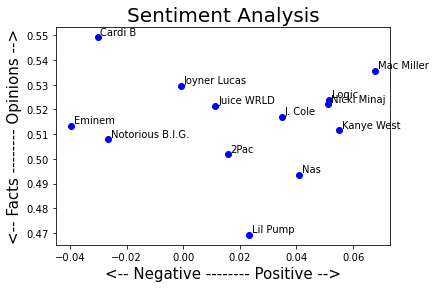

In [2]:
import matplotlib.pyplot as plt

for i, rapper in enumerate(data.index):
    x = data.polarity.loc[rapper]
    y = data.subjectivity.loc[rapper]
    plt.scatter(x, y, color='blue')
    plt.text(x+.001, y+.001, data.index[i], fontsize=10)
    
plt.title('Sentiment Analysis', fontsize=20)
plt.xlabel('<-- Negative -------- Positive -->', fontsize=15)
plt.ylabel('<-- Facts -------- Opinions -->', fontsize=15)

plt.show()

In [3]:
import numpy as np
import math

def split_text(text, n=10):
    length = len(text)
    size = math.floor(length / n)
    start = np.arange(0, length, size)
    
    split_list = []
    for piece in range(n):
        split_list.append(text[start[piece]:start[piece]+size])
    return split_list

In [4]:
list_pieces = []
for t in data.lyrics:
    split = split_text(t)
    list_pieces.append(split)

list_pieces

[['  [Intro: 2Pac & Snoop Doggy Dogg] Up out of there Ain\'t nothin\' but a gangsta party Eh, light that up, Snoop! Why you actin\' like that? Ahh shit, you done fucked up now (Ain\'t nothin\' but a gangsta party) You done put two of America\'s most wanted In the same motherfuckin\' place at the same motherfuckin\' time? (Ain\'t nothin\' but a gangsta party) Ha, ha, ha, ha, y\'all niggas about to feel this (Ain\'t nothin\' but a gangsta party) Break out the champagne glasses and the motherfuckin\' condoms Have one on us, a\'ight? (Ain\'t nothin\' but a gangsta party) A toast to the gangsters  [Verse 1: 2Pac] Picture perfect, I paint a perfect picture Bomb the hoochies with precision, my intention\'s to get richer With the S-N double-O-P, Dogg, my fuckin\' homie You\'s a cold-ass nigga on them hogs  [Verse 2: Snoop Doggy Dogg] Sure \'nough, I keep my hand on my gun \'Cause they got me on the run Now I\'m back in the courtroom, waitin\' on the outcome "Free 2Pac" is all that\'s on a nigg

In [5]:
len(list_pieces), len(list_pieces[0])

(13, 10)

In [6]:
polarity_lyrics = []
for lp in list_pieces:
    polarity_piece = []
    for p in lp:
        polarity_piece.append(TextBlob(p).sentiment.polarity)
    polarity_lyrics.append(polarity_piece)
    
polarity_lyrics[0]

[0.02118470515033943,
 -0.003295937305489204,
 -0.009680163376499464,
 0.013936868196191698,
 0.012800639706250599,
 0.030330252058963676,
 0.04385026650973236,
 0.030215640378285804,
 0.00679842272921761,
 0.008829466518593194]

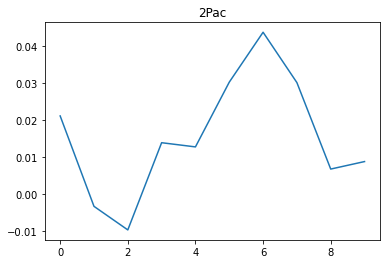

In [7]:
## plot for one single rapper
plt.plot(polarity_lyrics[0])
plt.title(data.index[0])
plt.show()

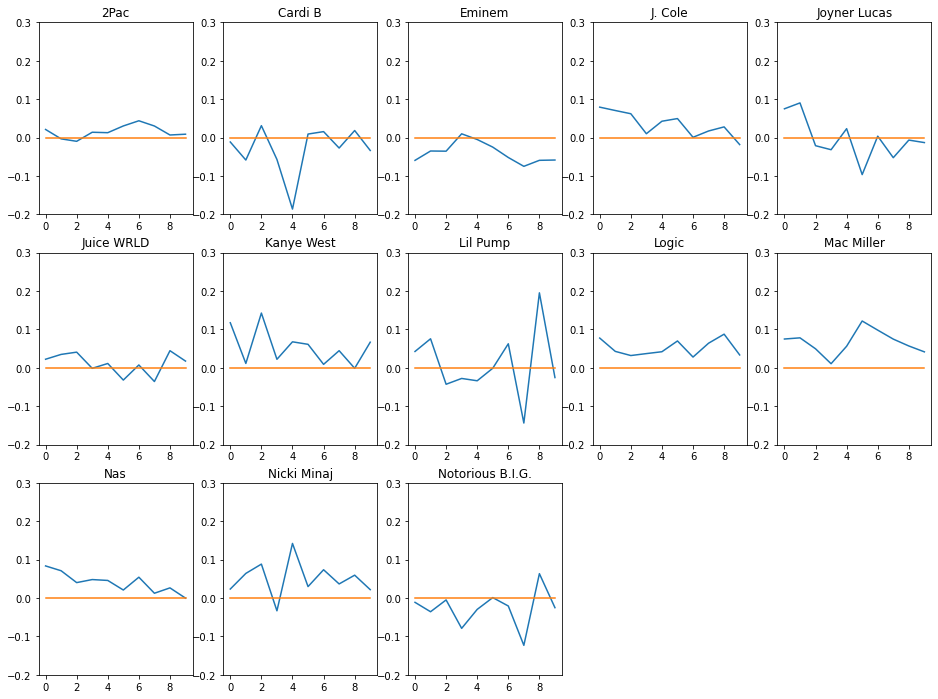

In [8]:
## plot all rappers
plt.rcParams['figure.figsize'] = [16, 12]
for i, rapper in enumerate(data.index):
    plt.subplot(3, 5, i+1)
    plt.plot(polarity_lyrics[i])
    plt.plot(np.arange(0,10), np.zeros(10))
    plt.title(data.index[i])
    plt.ylim(ymin=-.2, ymax=.3)
    
plt.show()